## Enzyme Kinetics in a NON Michaelis-Menten modality
#### 3 Coupled Reactions: `S <-> P` , `E + S <-> ES`, and  `ES <-> E + P`     
A direct reaction and the same reaction, catalyzed by an enzyme `E` and showing the intermediate state.  
Re-run from same initial concentrations of S ("Substrate") and P ("Product"), for various concentations of the enzyme `E`: from zero to hugely abundant 
### We'll REJECT the customary Michaelis-Menten assumptions that `[E] << [S]` and that the rate constants satisfy `k1_reverse >> k2_forward` !   
#### We'll **repeat runs with increasingly higher initial concentration of Enzyme**, and explore exotic scenarios with lavish amount of enzyme, leading to diminishing (though fast-produced!) products,  and a buildup of the (not-so-transient!) `ES` intermediate

### TAGS :  "uniform compartment", "chemistry", "enzymes"

In [1]:
LAST_REVISED = "Sep. 2, 2025"
LIFE123_VERSION = "1.0.0rc5"         # Library version this experiment is based on

In [2]:
#import set_path                    # Using MyBinder?  Uncomment this before running the next cell!

In [3]:
#import sys
#sys.path.append("C:/some_path/my_env_or_install")   # CHANGE to the folder containing your venv or libraries installation!
# NOTE: If any of the imports below can't find a module, uncomment the lines above, or try:  import set_path   

import ipynbname

from life123 import check_version, ChemData, ReactionRegistry, UniformCompartment, CollectionTabular, GraphicLog

import pandas as pd

In [4]:
check_version(LIFE123_VERSION)    # To check compatibility

OK


In [5]:
# Initialize the HTML logging (for the graphics)
log_file = ipynbname.name() + ".log.htm"    # Use the notebook base filename for the log file
                                            # IN CASE OF PROBLEMS, set manually to any desired name

# Set up the use of some specified graphic (Vue) components
GraphicLog.config(filename=log_file,
                  components=["vue_cytoscape_2"],
                  extra_js="https://cdnjs.cloudflare.com/ajax/libs/cytoscape/3.21.2/cytoscape.umd.js")

-> Output will be LOGGED into the file 'enzyme_4.log.htm'


In [6]:
# Initialize the system
chem_data = ChemData(names=["S","E","ES","P"], plot_colors=["cyan","violet","red","green"])

chem_data.all_chemicals()

,name,label,plot_color
0,S,S,cyan
1,E,E,violet
2,ES,ES,red
3,P,P,green


In [7]:
rxns = ReactionRegistry(chem_data=chem_data)


# Reaction S <-> P , with 1st-order kinetics, favorable thermodynamics in the forward direction, 
# and a forward rate that is much slower than it would be with the enzyme - as seen in the next reaction, below
rxns.add_reaction(reactants="S", products="P",
                  kF=1., delta_G=-3989.73, temp=298.15)

     
# Reaction E + S <-> ES , with 1st-order kinetics, and a forward rate that is much faster than it was without the enzyme
# Thermodynamically, the forward direction is at a disadvantage (higher energy state) because of the activation barrier in forming the transient state ES
rxns.add_reaction(reactants=["E", "S"], products="ES",
                  kF=100., delta_G=2000, temp=298.15)                           
                                                      
# Reaction ES <-> E + P , with 1st-order kinetics, and a forward rate that is much faster than it was without the enzyme
# Thermodynamically, the total energy change of this reaction and the previous one adds up to the same value as the reaction without the enzyme (-3989.73)
rxns.add_reaction(reactants="ES", products=["E", "P"],
                  kF=200., delta_G=-5989.73, temp=298.15)

rxns.describe_reactions()

# Send the plot of the reaction network to the HTML log file
rxns.plot_reaction_network("vue_cytoscape_2")

Number of reactions: 3
0: S <-> P  (Elementary Unimolecular reaction)  (kF = 1 / kR = 0.2 / delta_G = -3,989.7 / K = 5 / Temp = 25 C)
1: E + S  <-> ES  (Elementary Synthesis reaction)  (kF = 100 / kR = 224.07 / delta_G = 2,000 / K = 0.44629 / Temp = 25 C)
2: ES <-> E + P  (Elementary Decomposition reaction)  (kF = 200 / kR = 17.851 / delta_G = -5,989.7 / K = 11.204 / Temp = 25 C)
Chemicals involved in the above reactions: {"S" (cyan), "E" (violet), "ES" (red), "P" (green)}
[GRAPHIC ELEMENT SENT TO LOG FILE `enzyme_4.log.htm`]


Note that `E` is not labeled as an "enzyme" because it doesn't appear as a catalyst in any of the registered reactions; it only becomes an enzyme in the context of the _compound_ reaction from (2) and (3)

# PART 1. Set the initial concentrations of all the chemicals - starting with no enzyme

In [8]:
uc = UniformCompartment(reactions=rxns, preset="mid")
uc.set_conc(conc={"S": 20.})      # Initially, no enzyme `E`
uc.describe_state()

SYSTEM STATE at Time t = 0:
4 species:
  Species 0 (S). Conc: 20.0
  Species 1 (E). Conc: 0.0
  Species 2 (ES). Conc: 0.0
  Species 3 (P). Conc: 0.0
Chemicals involved in reactions: ['ES', 'P', 'E', 'S']


### Advance the reactions (for now without enzyme) to equilibrium

In [9]:
#uc.set_diagnostics()       # To save diagnostic information about the call to single_compartment_react()

# Perform the reactions
uc.single_compartment_react(duration=4.0,
                            initial_step=0.1)

27 total variable step(s) taken in 0.068 sec
Norm usage: {'norm_A': 14, 'norm_B': 15, 'norm_C': 14, 'norm_D': 14}
System Time is now: 4.1508


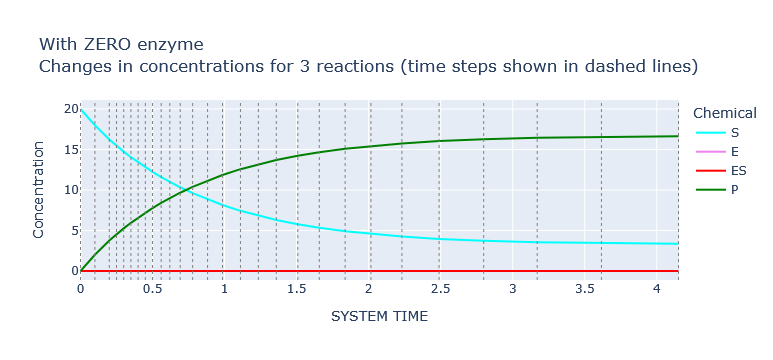

In [10]:
uc.plot_history(show_intervals=True, title_prefix="With ZERO enzyme")

### The reactions, lacking enzyme, are proceeding slowly towards equilibrium, just like the reaction that was discussed in part 1 of the experiment "enzyme_1"

In [11]:
# Verify that the reactions have reached equilibrium
uc.is_in_equilibrium(tolerance=2)

0: S <-> P
Current concentrations: [S] = 3.37 ; [P] = 16.63
1. Ratio of reactant/product concentrations, adjusted for reaction orders: 4.93491
    Formula used:  [P] / [S]
2. Ratio of forward/reverse reaction rates: 5.00001
Discrepancy between the two values: 1.302 %
Reaction IS in equilibrium (within 2% tolerance)

1: E + S  <-> ES
Current concentrations: [E] = 0 ; [S] = 3.37 ; [ES] = 0
Reaction IS in equilibrium because it can't proceed in either direction due to zero concentrations in both some reactants and products!

2: ES <-> E + P
Current concentrations: [ES] = 0 ; [E] = 0 ; [P] = 16.63
Reaction IS in equilibrium because it can't proceed in either direction due to zero concentrations in both some reactants and products!



True

In [12]:
# Locate the intersection of the curves for [S] and [P]:
uc.curve_intersect("S", "P", t_start=0, t_end=1.0)

(0.7322948238817497, 10.0)

In [13]:
uc.get_history(columns=['SYSTEM TIME', 'E', 'ES', 'P'], tail=1)  # Last point in the simulation

,SYSTEM TIME,E,ES,P
27,4.150766,0.0,0.0,16.630111


In [14]:
P_equil = uc.get_chem_conc("P")
P_equil

16.63011072773748

In [15]:
P_70_threshold = P_equil * 0.70
P_70_threshold

11.641077509416236

In [16]:
uc.reach_threshold(chem="P", threshold=P_70_threshold)

0.9536647543782931

# PART 2. Re-start all the reactions from the same initial concentrations - except for now having a tiny amount of enzyme (two orders of magnitude less than the starting [S])

In [17]:
E_init = 0.2     # A tiny bit of enzyme `E`: 1/100 of the initial [S]

In [18]:
uc = UniformCompartment(reactions=rxns, preset="slower")      # A brand-new simulation, with the same chemicals and reactions as before

uc.set_conc(conc={"S": 20., "E": E_init})
uc.describe_state()

SYSTEM STATE at Time t = 0:
4 species:
  Species 0 (S). Conc: 20.0
  Species 1 (E). Conc: 0.2
  Species 2 (ES). Conc: 0.0
  Species 3 (P). Conc: 0.0
Chemicals involved in reactions: ['ES', 'P', 'E', 'S']


In [19]:
# Perform the reactions (The duration of the run was manually adjusted for optimal visibility)
uc.single_compartment_react(duration=1.3,
                            initial_step=0.00005)

1476 total variable step(s) taken in 3.162 sec
Number of step re-do's because of elective soft aborts: 1
Norm usage: {'norm_A': 1458, 'norm_B': 1472, 'norm_C': 1458, 'norm_D': 1458}
System Time is now: 1.3008


In [20]:
# Verify that the reactions have reached equilibrium
uc.is_in_equilibrium(explain=False)

True

In [21]:
# Locate the intersection of the curves for [S] and [P]:
uc.curve_intersect("S", "P", t_start=0, t_end=1.0)

(0.24856557905040474, 9.926581378605173)

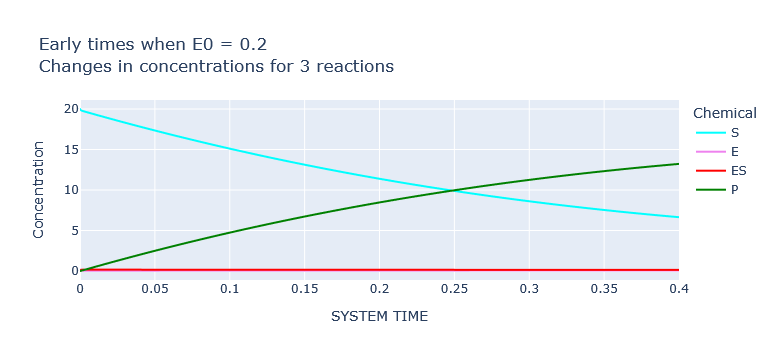

In [22]:
# Early part of the reaction
uc.plot_history(title_prefix=f"Early times when E0 = {E_init}", range_x=[0, 0.4])

In [23]:
# Locate the intersection of the curves for [S] and [P]:
uc.curve_intersect("S", "P", t_start=0, t_end=0.4)

(0.24856557905040474, 9.926581378605173)

### Now, let's investigate E and ES in the very early times

## Notice how even a tiny amount of enzyme (1/100 of the initial [S])  makes a very pronounced difference!

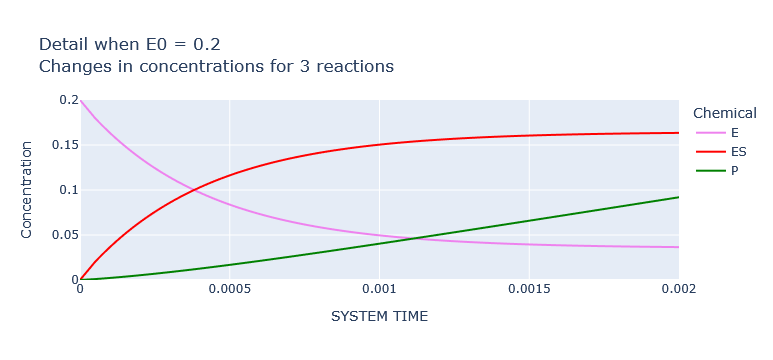

In [24]:
# The very early part of the reaction
uc.plot_history(chemicals=['E', 'ES', 'P'],
                title_prefix=f"Detail when E0 = {E_init}", range_x=[0, 0.002], range_y=[0, 0.2])

### Notice how, with this small initial concentration of [E], the timescale of [E] and [ES] is vastly faster than that of [P] and [S]

plot_pandas() NOTICE: Excessive number of vertical lines (1477) - only showing 1 every 10 lines


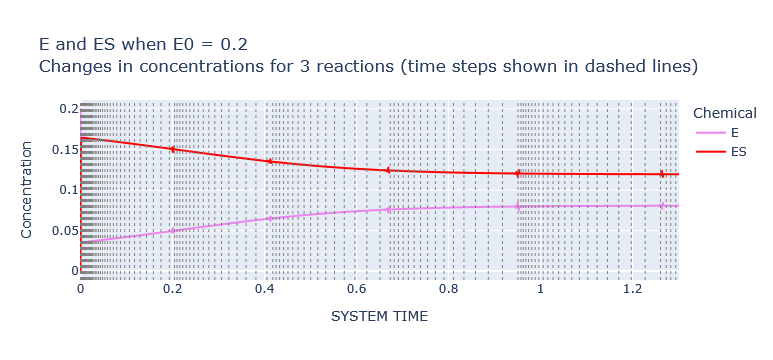

In [25]:
# The full reaction of E and ES
uc.plot_history(chemicals=['E', 'ES'], show_intervals=True, 
                title_prefix=f"E and ES when E0 = {E_init}")

Notice how at every onset of instability in [E] or [ES], the adaptive time steps shrink down

In [26]:
uc.get_history(columns=['SYSTEM TIME', 'E', 'ES', 'P'], tail=1)  # Last point in the simulation

,SYSTEM TIME,E,ES,P
1476,1.30085,0.080546,0.119454,16.544949


Interestingly, most of the inital [E] of 0.2 is now, at equilibrium, stored as [ES]=0.119; the energy of the "activation barrier" from E + S to ES might be unrealistically low (2000 Joules).  Zooming in on the very earl part of the plot:

In [27]:
P_equil = uc.get_chem_conc("P")
P_equil

16.54494887428722

In [28]:
P_70_threshold = P_equil * 0.70
P_70_threshold

11.581464212001052

In [29]:
uc.reach_threshold(chem="P", threshold=P_70_threshold)

0.31446597160581014

# PART 3. Keep increasing the initial [E]

In [30]:
E_init = 1.0

In [31]:
uc = UniformCompartment(reactions=rxns, preset="slower")      # A brand-new simulation, with the same chemicals and reactions as before

uc.set_conc(conc={"S": 20., "E": E_init})     
uc.describe_state()

SYSTEM STATE at Time t = 0:
4 species:
  Species 0 (S). Conc: 20.0
  Species 1 (E). Conc: 1.0
  Species 2 (ES). Conc: 0.0
  Species 3 (P). Conc: 0.0
Chemicals involved in reactions: ['ES', 'P', 'E', 'S']


In [32]:
# Perform the reactions (The duration of the run was manually adjusted for optimal visibility)
uc.single_compartment_react(duration=0.4, 
                            initial_step=0.00005)

866 total variable step(s) taken in 2.016 sec
Number of step re-do's because of elective soft aborts: 1
Norm usage: {'norm_A': 844, 'norm_B': 849, 'norm_C': 844, 'norm_D': 844}
System Time is now: 0.40016


In [33]:
# Verify that the reactions have reached equilibrium
uc.is_in_equilibrium(explain=False)

True

plot_pandas() NOTICE: Excessive number of vertical lines (867) - only showing 1 every 6 lines


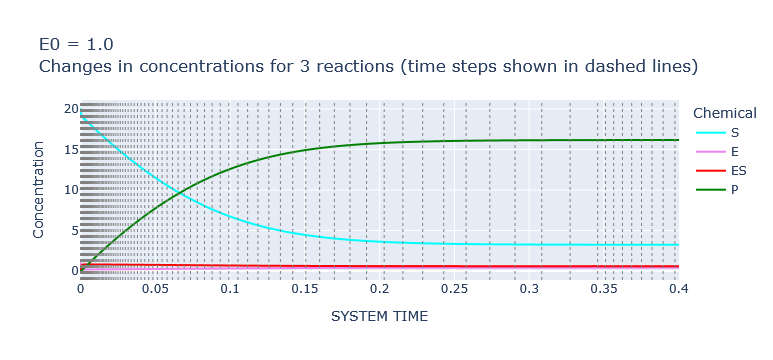

In [34]:
uc.plot_history(show_intervals=True, 
                title_prefix=f"E0 = {E_init}")

In [35]:
# Locate the intersection of the curves for [S] and [P]:
uc.curve_intersect("S", "P", t_start=0, t_end=0.4)

(0.06628340509848926, 9.635470546269993)

The timescale of [S] and [P] continues to become faster with a higher initial [E]

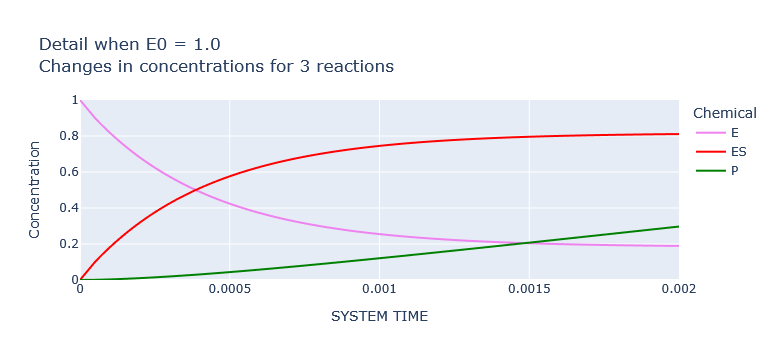

In [36]:
# The very early part of the reactions
uc.plot_history(chemicals=['E', 'ES', 'P'], 
                title_prefix=f"Detail when E0 = {E_init}", range_x=[0, 0.002], range_y=[0, 1.])

plot_pandas() NOTICE: Excessive number of vertical lines (867) - only showing 1 every 6 lines


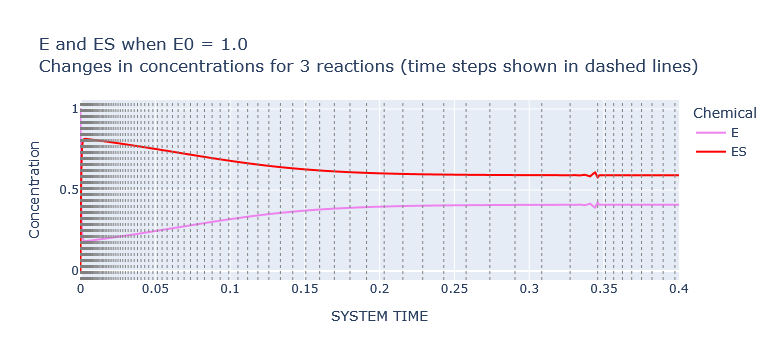

In [37]:
# The full reaction of E and ES
uc.plot_history(chemicals=['E', 'ES'], show_intervals=True, 
                title_prefix=f"E and ES when E0 = {E_init}")

In [38]:
uc.get_history(columns=['SYSTEM TIME', 'E', 'ES', 'P'], tail=1)  # Last point in the simulation

,SYSTEM TIME,E,ES,P
866,0.400158,0.409128,0.590872,16.1715


In [39]:
P_equil = uc.get_chem_conc("P")
P_equil

16.171500029051185

#### P_equil continues to decrease with increasing initial [E]

In [40]:
P_70_threshold = P_equil * 0.70
P_70_threshold

11.32005002033583

In [41]:
uc.reach_threshold(chem="P", threshold=P_70_threshold)

0.08364939325100468

#### The time at which we reach the 70% threshold of the equilibrium value of P continues to decrease with increasing initial [E]

# PART 4. Keep increasing the initial [E]

In [42]:
E_init = 2.0      # 1/10 of the initial [S]

In [43]:
uc = UniformCompartment(reactions=rxns, preset="slower")      # A brand-new simulation, with the same chemicals and reactions as before

uc.set_conc(conc={"S": 20., "E": E_init})     
uc.describe_state()

SYSTEM STATE at Time t = 0:
4 species:
  Species 0 (S). Conc: 20.0
  Species 1 (E). Conc: 2.0
  Species 2 (ES). Conc: 0.0
  Species 3 (P). Conc: 0.0
Chemicals involved in reactions: ['ES', 'P', 'E', 'S']


In [44]:
# Perform the reactions (The duration of the run was manually adjusted for optimal visibility)
uc.single_compartment_react(duration=0.2,
                            initial_step=0.00005)

818 total variable step(s) taken in 1.925 sec
Number of step re-do's because of elective soft aborts: 1
Norm usage: {'norm_A': 812, 'norm_B': 816, 'norm_C': 812, 'norm_D': 812}
System Time is now: 0.20175


In [45]:
# Verify that the reactions have reached equilibrium
uc.is_in_equilibrium(explain=False)

True

plot_pandas() NOTICE: Excessive number of vertical lines (819) - only showing 1 every 6 lines


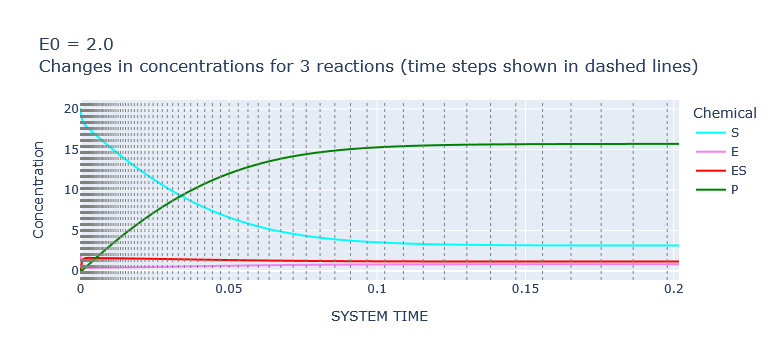

In [46]:
uc.plot_history(show_intervals=True, 
                title_prefix=f"E0 = {E_init}")

In [47]:
# Locate the intersection of the curves for [S] and [P]:
uc.curve_intersect("S", "P", t_start=0, t_end=0.4)

(0.033892638379102225, 9.277504597225233)

The timescale of [S] and [P] continues to become faster with a higher initial [E]

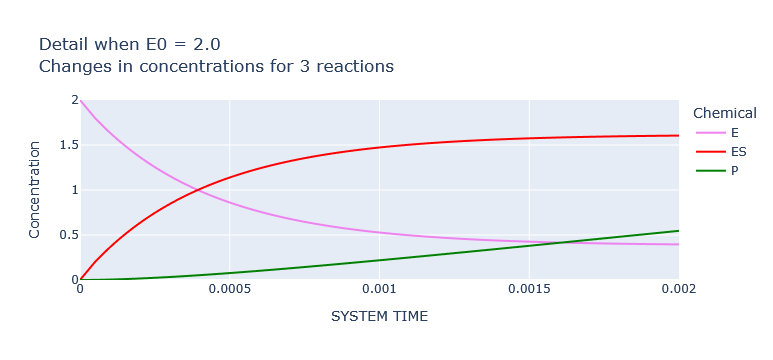

In [48]:
#The very early part of the reaction
uc.plot_history(chemicals=['E', 'ES', 'P'],
                title_prefix=f"Detail when E0 = {E_init}", range_x=[0, 0.002], range_y=[0, 2.])

plot_pandas() NOTICE: Excessive number of vertical lines (819) - only showing 1 every 6 lines


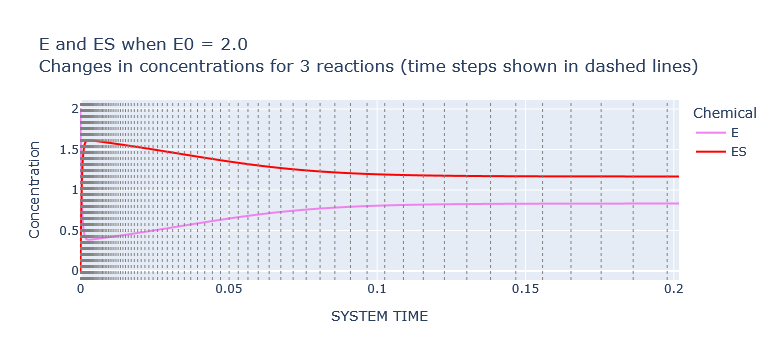

In [49]:
# Show the full reaction of E and ES
uc.plot_history(chemicals=['E', 'ES'], show_intervals=True, 
                title_prefix=f"E and ES when E0 = {E_init}")

In [50]:
uc.get_history(columns=['SYSTEM TIME', 'E', 'ES', 'P'], tail=1)  # Last point in the simulation

,SYSTEM TIME,E,ES,P
818,0.201753,0.832849,1.167151,15.691155


In [51]:
P_equil = uc.get_chem_conc("P")
P_equil

15.69115548729148

#### P_equil continues to decrease with increasing initial [E]

In [52]:
P_70_threshold = P_equil * 0.70
P_70_threshold

10.983808841104036

In [53]:
uc.reach_threshold(chem="P", threshold=P_70_threshold)

0.04311547431679562

#### The time at which we reach the 70% threshold of the equilibrium value of P continues to decrease with increasing initial [E]

# PART 5. Keep increasing the initial [E]

In [54]:
E_init = 10.0      # 1/2 of the initial [S]

In [55]:
uc = UniformCompartment(reactions=rxns, preset="slower")      # A brand-new simulation, with the same chemicals and reactions as before

uc.set_conc(conc={"S": 20., "E": E_init})     
uc.describe_state()

SYSTEM STATE at Time t = 0:
4 species:
  Species 0 (S). Conc: 20.0
  Species 1 (E). Conc: 10.0
  Species 2 (ES). Conc: 0.0
  Species 3 (P). Conc: 0.0
Chemicals involved in reactions: ['ES', 'P', 'E', 'S']


In [56]:
# Perform the reactions (The duration of the run was manually adjusted for optimal visibility)
uc.single_compartment_react(duration=0.05,
                            initial_step=0.00005)

836 total variable step(s) taken in 1.930 sec
Number of step re-do's because of elective soft aborts: 2
Norm usage: {'norm_A': 834, 'norm_B': 838, 'norm_C': 834, 'norm_D': 834}
System Time is now: 0.050265


In [57]:
# Verify that the reactions have reached equilibrium
uc.is_in_equilibrium(explain=False)

True

plot_pandas() NOTICE: Excessive number of vertical lines (837) - only showing 1 every 6 lines


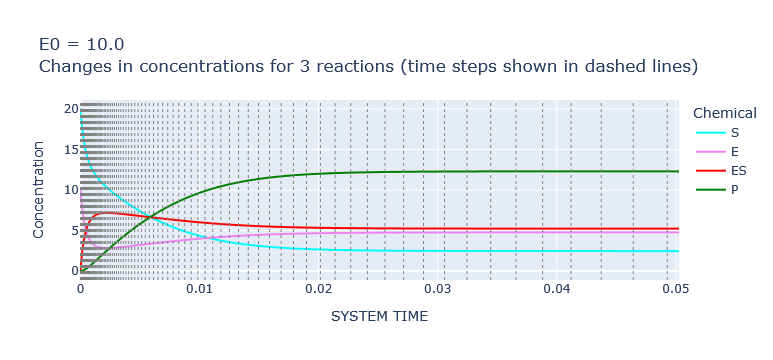

In [58]:
uc.plot_history(show_intervals=True, 
                title_prefix=f"E0 = {E_init}")

In [59]:
# Locate the intersection of the curves for [S] and [P]:
uc.curve_intersect("S", "P", t_start=0, t_end=0.05)

(0.005877353573479905, 6.680399989705835)

#### The timescale of [S] and [P] continues to become faster with a higher initial [E] -- **AND THEY'RE NOW APPROACHING THE TIMESCALES OF E AND ES**

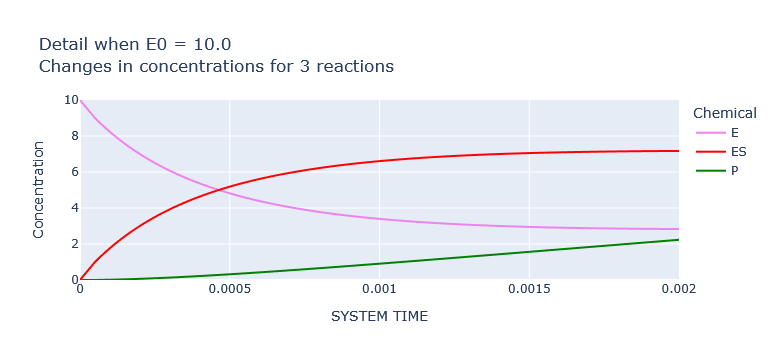

In [60]:
# The very early part of the reaction
uc.plot_history(chemicals=['E', 'ES', 'P'], 
                title_prefix=f"Detail when E0 = {E_init}", range_x=[0, 0.002], range_y=[0, 10.])

plot_pandas() NOTICE: Excessive number of vertical lines (837) - only showing 1 every 6 lines


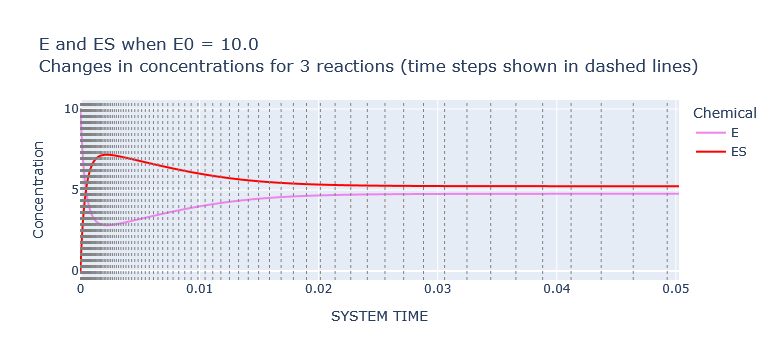

In [61]:
# The full reaction of E and ES
uc.plot_history(chemicals=['E', 'ES'], show_intervals=True, 
                title_prefix=f"E and ES when E0 = {E_init}")

#### Notice that at these higher initial concentrations of [E], we're now beginning to see overshoots in [E] and [ES]

In [62]:
uc.get_history(columns=['SYSTEM TIME', 'E', 'ES', 'P'], tail=1)  # Last point in the simulation

,SYSTEM TIME,E,ES,P
836,0.050265,4.765697,5.234303,12.304598


In [63]:
P_equil = uc.get_chem_conc("P")
P_equil

12.304597774138907

#### P_equil continues to decrease with increasing initial [E]

In [64]:
P_70_threshold = P_equil * 0.70
P_70_threshold

8.613218441897235

In [65]:
uc.reach_threshold(chem="P", threshold=P_70_threshold)

0.008274545666098492

#### The time at which we reach the 70% threshold of the equilibrium value of P continues to decrease with increasing initial [E]

# PART 6. Keep increasing the initial [E]

In [66]:
E_init = 20.0      # Same as the initial [S]

In [67]:
uc = UniformCompartment(reactions=rxns, preset="slower")      # A brand-new simulation, with the same chemicals and reactions as before

uc.set_conc(conc={"S": 20., "E": E_init})     
uc.describe_state()

SYSTEM STATE at Time t = 0:
4 species:
  Species 0 (S). Conc: 20.0
  Species 1 (E). Conc: 20.0
  Species 2 (ES). Conc: 0.0
  Species 3 (P). Conc: 0.0
Chemicals involved in reactions: ['ES', 'P', 'E', 'S']


In [68]:
# Perform the reactions (The duration of the run was manually adjusted for optimal visibility)
uc.single_compartment_react(duration=0.02, 
                            initial_step=0.00005)

757 total variable step(s) taken in 1.756 sec
Number of step re-do's because of elective soft aborts: 2
Norm usage: {'norm_A': 743, 'norm_B': 746, 'norm_C': 742, 'norm_D': 742}
System Time is now: 0.020147


In [69]:
# Verify that the reactions have reached equilibrium
uc.is_in_equilibrium(explain=False)

True

plot_pandas() NOTICE: Excessive number of vertical lines (758) - only showing 1 every 6 lines


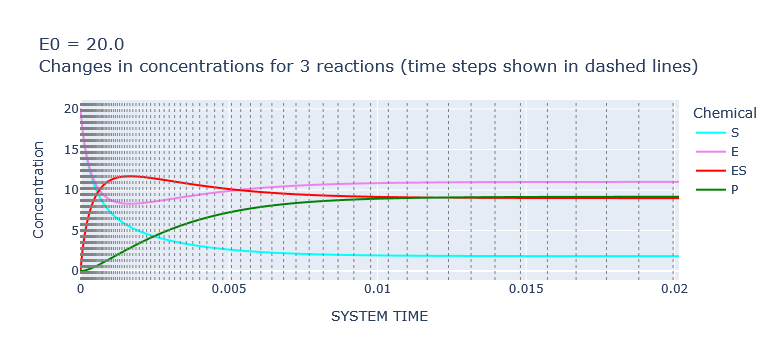

In [70]:
uc.plot_history(show_intervals=True, 
                title_prefix=f"E0 = {E_init}")

In [71]:
# Locate the intersection of the curves for [S] and [P]:
uc.curve_intersect("S", "P", t_start=0, t_end=0.02)

(0.0024715441102170356, 4.283809315596441)

#### The timescale of [S] and [P] continues to become faster with a higher initial [E] -- **AND THEY'RE NOW GETTING CLOSE THE TIMESCALES OF E AND ES**

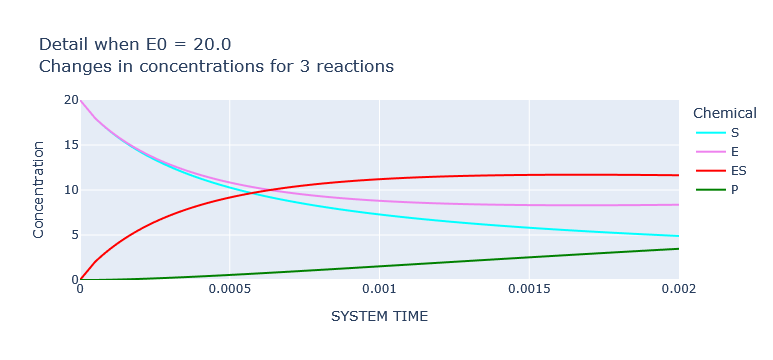

In [72]:
# The very early part of the reaction
uc.plot_history(title_prefix=f"Detail when E0 = {E_init}", range_x=[0, 0.002], range_y=[0, 20.])

plot_pandas() NOTICE: Excessive number of vertical lines (758) - only showing 1 every 6 lines


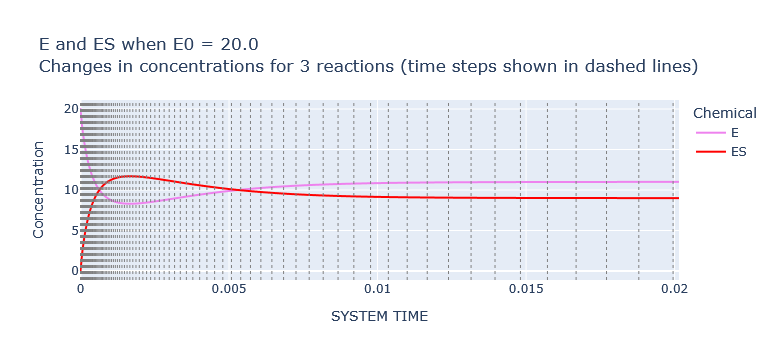

In [73]:
# The full reaction of E and ES
uc.plot_history(chemicals=['E', 'ES'], show_intervals=True, 
                title_prefix=f"E and ES when E0 = {E_init}")

#### At these higher initial concentrations of [E], we're now beginning to see overshoots in [E] and [ES] that overlap less

In [74]:
uc.get_history(columns=['SYSTEM TIME', 'E', 'ES', 'P'], tail=1)  # Last point in the simulation

,SYSTEM TIME,E,ES,P
757,0.020147,10.998147,9.001853,9.163739


In [75]:
P_equil = uc.get_chem_conc("P")
P_equil

9.163739207468186

#### P_equil continues to decrease with increasing initial [E]

In [76]:
P_70_threshold = P_equil * 0.70
P_70_threshold

6.41461744522773

In [77]:
uc.reach_threshold(chem="P", threshold=P_70_threshold)

0.004076150862005783

#### The time at which we reach the 70% threshold of the equilibrium value of P continues to decrease with increasing initial [E]

# PART 7. Keep increasing the initial [E]

In [78]:
E_init = 30.0      # 50% higher than the initial [S]

In [79]:
uc = UniformCompartment(reactions=rxns, preset="slower")      # A brand-new simulation, with the same chemicals and reactions as before

uc.set_conc(conc={"S": 20., "E": E_init})     
uc.describe_state()

SYSTEM STATE at Time t = 0:
4 species:
  Species 0 (S). Conc: 20.0
  Species 1 (E). Conc: 30.0
  Species 2 (ES). Conc: 0.0
  Species 3 (P). Conc: 0.0
Chemicals involved in reactions: ['ES', 'P', 'E', 'S']


In [80]:
# Perform the reactions (The duration of the run was manually adjusted for optimal visibility)
uc.single_compartment_react(duration=0.01, 
                            initial_step=0.00005)

749 total variable step(s) taken in 1.702 sec
Number of step re-do's because of elective soft aborts: 2
Norm usage: {'norm_A': 743, 'norm_B': 746, 'norm_C': 742, 'norm_D': 742}
System Time is now: 0.010054


In [81]:
# Verify that the reactions have reached equilibrium
uc.is_in_equilibrium(explain=False)

True

plot_pandas() NOTICE: Excessive number of vertical lines (750) - only showing 1 every 6 lines


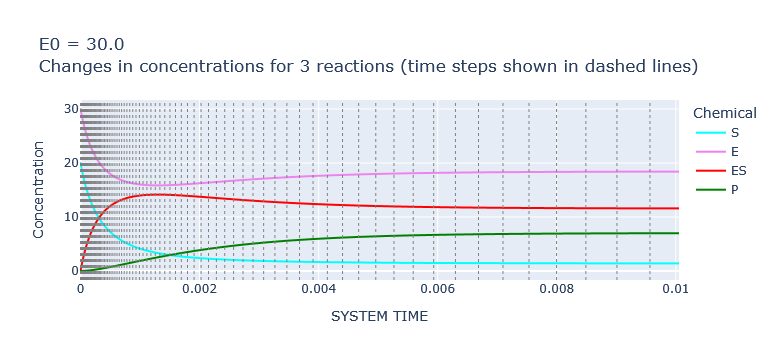

In [82]:
uc.plot_history(show_intervals=True, 
                title_prefix=f"E0 = {E_init}")

In [83]:
# Locate the intersection of the curves for [S] and [P]:
uc.curve_intersect("S", "P", t_start=0, t_end=0.01)

(0.0015007776137844029, 2.9518860757696133)

#### The timescale of [S] and [P] continues to become faster with a higher initial [E] -- **AND THEY'RE NOW COMPARABLE THE TIMESCALES OF E AND ES**

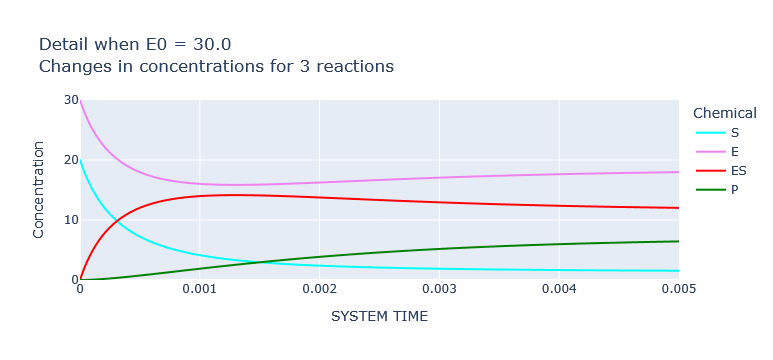

In [84]:
#The very early part of the reaction
uc.plot_history(title_prefix=f"Detail when E0 = {E_init}", range_x=[0, 0.005], range_y=[0, 30.])

plot_pandas() NOTICE: Excessive number of vertical lines (750) - only showing 1 every 6 lines


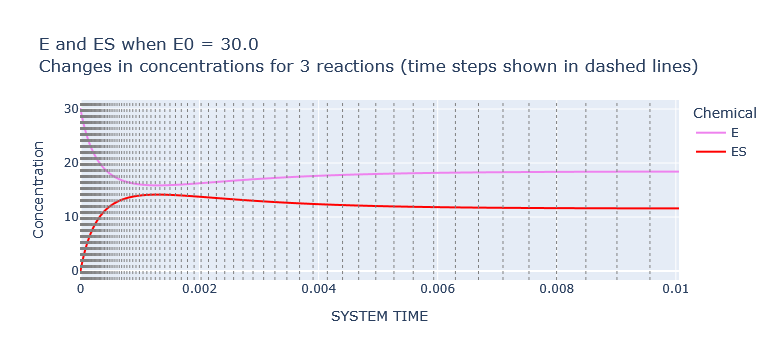

In [85]:
# The full reaction of E and ES
uc.plot_history(chemicals=['E', 'ES'], show_intervals=True, 
                title_prefix=f"E and ES when E0 = {E_init}")

#### At these high initial concentrations of [E], we're now beginning to see [E] and [ES] no longer overlapping; the overshoot is still present in both

In [86]:
uc.get_history(columns=['SYSTEM TIME', 'E', 'ES', 'P'], tail=1)  # Last point in the simulation

,SYSTEM TIME,E,ES,P
749,0.010054,18.411337,11.588663,6.998847


In [87]:
P_equil = uc.get_chem_conc("P")
P_equil

6.998846772430818

#### P_equil continues to decrease with increasing initial [E]

In [88]:
P_70_threshold = P_equil * 0.70
P_70_threshold

4.899192740701572

In [89]:
uc.reach_threshold(chem="P", threshold=P_70_threshold)

0.002747856201107546

#### The time at which we reach the 70% threshold of the equilibrium value of P continues to decrease with increasing initial [E]

# PART 8. Keep increasing the initial [E]

In [90]:
E_init = 60.0      # Triple the initial [S]

In [91]:
uc = UniformCompartment(reactions=rxns, preset="slower")      # A brand-new simulation, with the same chemicals and reactions as before

uc.set_conc(conc={"S": 20., "E": E_init})     
uc.describe_state()

SYSTEM STATE at Time t = 0:
4 species:
  Species 0 (S). Conc: 20.0
  Species 1 (E). Conc: 60.0
  Species 2 (ES). Conc: 0.0
  Species 3 (P). Conc: 0.0
Chemicals involved in reactions: ['ES', 'P', 'E', 'S']


In [92]:
# Perform the reactions (The duration of the run was manually adjusted for optimal visibility)
uc.single_compartment_react(duration=0.005,
                            initial_step=0.00005)

770 total variable step(s) taken in 1.758 sec
Number of step re-do's because of elective soft aborts: 3
Norm usage: {'norm_A': 765, 'norm_B': 767, 'norm_C': 764, 'norm_D': 764}
System Time is now: 0.0050084


In [93]:
# Verify that the reactions have reached equilibrium
uc.is_in_equilibrium(explain=False)

True

plot_pandas() NOTICE: Excessive number of vertical lines (771) - only showing 1 every 6 lines


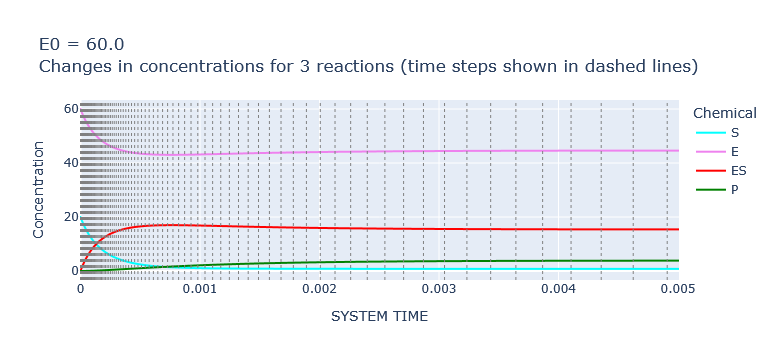

In [94]:
uc.plot_history(show_intervals=True, 
                title_prefix=f"E0 = {E_init}")

In [95]:
# Locate the intersection of the curves for [S] and [P]:
uc.curve_intersect("S", "P", t_start=0, t_end=0.005)

(0.0007023910558856093, 1.5191639777843677)

#### The timescales of [S] and [P] continues to become faster with a higher initial [E] -- **AND NOW THEY REMAIN COMPARABLE THE TIMESCALES OF E AND ES**

#### At these high initial concentrations of [E],  [E] and [ES] no longer overlapping, and are now getting further apart

In [96]:
uc.get_history(columns=['SYSTEM TIME', 'E', 'ES', 'P'], tail=1)  # Last point in the simulation

,SYSTEM TIME,E,ES,P
770,0.005008,44.60637,15.39363,3.832618


In [97]:
P_equil = uc.get_chem_conc("P")
P_equil

3.832618199402545

#### P_equil continues to decrease with increasing initial [E]

In [98]:
P_70_threshold = P_equil * 0.70
P_70_threshold

2.682832739581781

In [99]:
uc.reach_threshold(chem="P", threshold=P_70_threshold)

0.001390053726276219

#### The time at which we reach the 70% threshold of the equilibrium value of P continues to decrease with increasing initial [E]

# PART 9. Keep increasing the initial [E]

In [100]:
E_init = 100.0      # Quintuple the initial [S]

In [101]:
uc = UniformCompartment(reactions=rxns, preset="slower")      # A brand-new simulation, with the same chemicals and reactions as before

uc.set_conc(conc={"S": 20., "E": E_init})     
uc.describe_state()

SYSTEM STATE at Time t = 0:
4 species:
  Species 0 (S). Conc: 20.0
  Species 1 (E). Conc: 100.0
  Species 2 (ES). Conc: 0.0
  Species 3 (P). Conc: 0.0
Chemicals involved in reactions: ['ES', 'P', 'E', 'S']


In [102]:
# Perform the reactions (The duration of the run was manually adjusted for optimal visibility)
uc.single_compartment_react(duration=0.003,
                            initial_step=0.00005)

785 total variable step(s) taken in 1.815 sec
Number of step re-do's because of elective soft aborts: 3
Norm usage: {'norm_A': 784, 'norm_B': 787, 'norm_C': 783, 'norm_D': 783}
System Time is now: 0.0030275


In [103]:
# Verify that the reactions have reached equilibrium
uc.is_in_equilibrium(explain=False)

True

plot_pandas() NOTICE: Excessive number of vertical lines (786) - only showing 1 every 6 lines


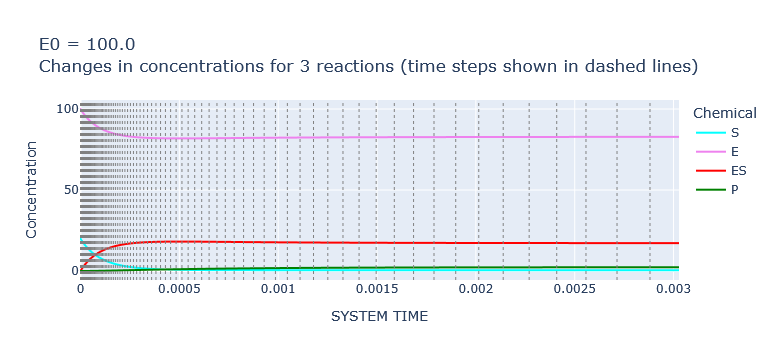

In [104]:
uc.plot_history(show_intervals=True, 
                title_prefix=f"E0 = {E_init}")

In [105]:
# Locate the intersection of the curves for [S] and [P]:
uc.curve_intersect("S", "P", t_start=0, t_end=0.005)

(0.0004266715141239805, 0.9491814221946882)

#### The timescales of [S] and [P] continues to become faster with a higher initial [E] -- **AND REMAIN COMPARABLE TO THE TIMESCALES OF E AND ES**

#### At these high initial concentrations of [E], the time curves of [E] and [ES] no longer overlapping, and are now getting further apart

In [106]:
uc.get_history(columns=['SYSTEM TIME', 'E', 'ES', 'P'], tail=1)  # Last point in the simulation

,SYSTEM TIME,E,ES,P
785,0.003028,82.779099,17.220901,2.312829


In [107]:
P_equil = uc.get_chem_conc("P")
P_equil

2.3128291895441793

#### P_equil continues to decrease with increasing initial [E]

In [108]:
P_70_threshold = P_equil * 0.70
P_70_threshold

1.6189804326809254

In [109]:
uc.reach_threshold(chem="P", threshold=P_70_threshold)

0.0008229365407830671

# CONCLUSION:  
### as the initial concentration of the Enzyme E increases from zero to lavish values much larger that the concentration of the Substrate S, the reaction keeps reaching an equilibrium faster and faster...  
#### BUT the equilibrium concentration of the Product P steadily _reduces_ - and ES, far from being transient, actually builds up.   
#### The **strange world of departing from the customary Michaelis-Menten assumptions** that `[E] << [S]` and that the rates satisfy `k1_reverse >> k2_forward` !

In [110]:
uc.get_history(head=1)  # First point in the simulation

,SYSTEM TIME,S,E,ES,P,step,caption
0,0.0,20.0,100.0,0.0,0.0,,Set concentration


In [111]:
uc.get_history(tail=1)  # Last point in the simulation

,SYSTEM TIME,S,E,ES,P,step,caption
785,0.003028,0.46627,82.779099,17.220901,2.312829,785,last reaction step


### When the initial [E] is quite high, relatively little of the reactant S goes into making the product P ; most of S binds with the abundant E, to produce a lasting ES 
The following manual stoichiometry check illustrates it.

#### Manual overall STOICHIOMETRY CHECK:

In [112]:
delta_S = 0.46627 - 20.0
delta_S

-19.53373

In [113]:
delta_E = 82.779099 - 100.0
delta_E

-17.220900999999998

In [114]:
delta_E = 82.779099 - 100.0
delta_E

-17.220900999999998

In [115]:
delta_ES = 17.220901 - 0
delta_ES

17.220901

In [116]:
rxns.describe_reactions()

Number of reactions: 3
0: S <-> P  (Elementary Unimolecular reaction)  (kF = 1 / kR = 0.2 / delta_G = -3,989.7 / K = 5 / Temp = 25 C)
1: E + S  <-> ES  (Elementary Synthesis reaction)  (kF = 100 / kR = 224.07 / delta_G = 2,000 / K = 0.44629 / Temp = 25 C)
2: ES <-> E + P  (Elementary Decomposition reaction)  (kF = 200 / kR = 17.851 / delta_G = -5,989.7 / K = 11.204 / Temp = 25 C)
Chemicals involved in the above reactions: {"S" (cyan), "E" (violet), "ES" (red), "P" (green)}


19.53373 units of `S` are consumed : a meager 2.312829 of that goes into the production of `P` (rxn 0)  ; the remainder of Delta S is:

In [117]:
19.53373 - 2.312829

17.220900999999998

That extra Delta S of 17.2209 combines with an equal amount of `E` to produce the same amount, 17.2209, of ES (rxn 1)  

`E`, now depleted by that amount of 17.2209, reaches the value:

In [118]:
100 - 17.2209

82.7791

In [119]:
# Also review that the chemical equilibrium holds, with the final simulation values
uc.is_in_equilibrium()

0: S <-> P
Current concentrations: [S] = 0.4663 ; [P] = 2.313
1. Ratio of reactant/product concentrations, adjusted for reaction orders: 4.96028
    Formula used:  [P] / [S]
2. Ratio of forward/reverse reaction rates: 5.00001
Discrepancy between the two values: 0.7945 %
Reaction IS in equilibrium (within 1% tolerance)

1: E + S  <-> ES
Current concentrations: [E] = 82.78 ; [S] = 0.4663 ; [ES] = 17.22
1. Ratio of reactant/product concentrations, adjusted for reaction orders: 0.446167
    Formula used:  [ES] / ([E][S])
2. Ratio of forward/reverse reaction rates: 0.446288
Discrepancy between the two values: 0.027 %
Reaction IS in equilibrium (within 1% tolerance)

2: ES <-> E + P
Current concentrations: [ES] = 17.22 ; [E] = 82.78 ; [P] = 2.313
1. Ratio of reactant/product concentrations, adjusted for reaction orders: 11.1175
    Formula used:  ([E][P]) / [ES]
2. Ratio of forward/reverse reaction rates: 11.2035
Discrepancy between the two values: 0.7677 %
Reaction IS in equilibrium (within

True